# **Problema 1: Integración analítica de flujos**

Halle las trayectorias, las líneas de corriente las trazas de una partícula ubicada en $(x_0, y_0)$ a $t = 0$, para los siguientes campos de velocidades bidimensionales:

(i) Una corriente uniforme constante $U$ superpuesta a otra corriente uniforme ortogonal a la primera. La velocidad $U'$ de la segunda corriente está modulada en forma armónica en el tiempo con período $\tau$.

(ii) Un flujo con campo de velocidad dado por
$$ \mathbf{u}(x, y, t) =  \frac{\alpha x}{1+\beta t}\mathbf{\hat{x}} + c\mathbf{\hat{y}} $$

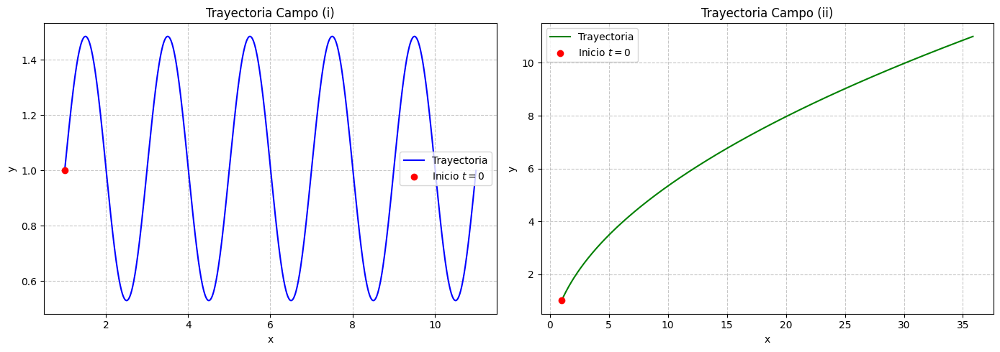

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def esquema(X, u, t, dt):
    """
    Calcula X(t+dt) a partir de X(t) y el campo de velocidades usando Euler explícito.
    """
    return X + u(X, t) * dt

def trayectoria(X0, u, N, dt):
    """
    Calcula numéricamente la solución a dX/dt = u(X,t)
    """
    d = X0.shape[0]
    ts = np.arange(0, N+1)*dt
    Xs = np.zeros((N+1, d))
    Xs[0] = X0
    for j in range(N):
        Xs[j+1] = esquema(Xs[j], u, ts[j], dt)
    return ts, Xs
    # Parámetros físicos (puedes modificarlos para explorar diferentes regímenes)
U_const = 1.0
U_amp = 1.5
tau = 2.0

alpha = 1.0
beta = 0.5
c = 1.0

def campo_1(X, t):
    """Campo de velocidades (i)"""
    u_x = U_const
    u_y = U_amp * np.cos(2 * np.pi * t / tau)
    return np.array([u_x, u_y])

def campo_2(X, t):
    """Campo de velocidades (ii)"""
    x = X[0]
    # Se evita división por cero si beta*t != -1
    u_x = (alpha * x) / (1 + beta * t)
    u_y = c
    return np.array([u_x, u_y])
    # Parámetros de integración
dt = 0.01
N = 1000 # Integramos hasta t = N*dt = 10 segundos
X0 = np.array([1.0, 1.0]) # Condición inicial (x0, y0) a t=0

# Calcular trayectorias
ts_1, Xs_1 = trayectoria(X0, campo_1, N, dt)
ts_2, Xs_2 = trayectoria(X0, campo_2, N, dt)

# Extraer coordenadas para graficar
x1, y1 = Xs_1[:, 0], Xs_1[:, 1]
x2, y2 = Xs_2[:, 0], Xs_2[:, 1]

# Configuración del gráfico
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

# Gráfico Campo (i)
ax[0].plot(x1, y1, color='blue', label='Trayectoria')
ax[0].scatter([X0[0]], [X0[1]], color='red', zorder=5, label=f'Inicio $t=0$')
ax[0].set_title('Trayectoria Campo (i)')
ax[0].set_xlabel('x')
ax[0].set_ylabel('y')
ax[0].grid(True, linestyle='--', alpha=0.7)
ax[0].legend()

# Gráfico Campo (ii)
ax[1].plot(x2, y2, color='green', label='Trayectoria')
ax[1].scatter([X0[0]], [X0[1]], color='red', zorder=5, label=f'Inicio $t=0$')
ax[1].set_title('Trayectoria Campo (ii)')
ax[1].set_xlabel('x')
ax[1].set_ylabel('y')
ax[1].grid(True, linestyle='--', alpha=0.7)
ax[1].legend()

plt.tight_layout()
plt.show()

# **Problema 2: Integración numérica de flujos**

Considere los siguientes campos de velocidad dependientes del tiempo $\mathbf{u}(\mathbf{x}, t)$ en el caso bidimensional $\mathbf{x} = x~\mathbf{\hat{x}}+ y~\mathbf{\hat{y}}$.
En cada caso, adimensionalice los campos y calcule numéricamente las trayectorias y la evolución de las líneas de corriente eligiendo puntos de colocación iniciales más apropiados para el flujo en cuestión:

(i) Una fuente lineal de caudal constante $Q$ superpuesta a una corriente uniforme cuya velocidad aumenta linealmente con el tiempo $U(t) = \gamma_0 t$.

(ii) Una fuente lineal de caudal constante $Q$ superpuesta a un torbellino cuya circulación $\Gamma$ decrece exponencialmente con un tiempo característico $\tau$.
_Ayuda: Tras adimensionalizar quedará un parámetro libre. Bárralo para estudiar los distintos regímenes._

(iii) Una fuente lineal de caudal constante $Q$ superpuesta a una corriente uniforme oscilante con velocidad $U(t) = U_0\cos(\omega t)$.


Aunque no se nos pida, hemos calculado las trayectorias y las lineas de corriente del los campos en el problema 1

In [ ]:
try:
    from google.colab import output
    output.enable_custom_widget_manager()
except ImportError:
    pass # Por si lo corres fuera de Colab en el futuro

import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact, FloatSlider

# --- 2. Motor Numérico y Modelo Físico ---
def esquema(X, u, t, dt):
    return X + u(X, t) * dt

def linea_de_corriente(l0, u, t, N, ds):
    d = l0.shape[0]
    s = np.arange(0, N+1)*ds
    ls = np.zeros((N+1, d))
    ls[0] = l0

    u_lc = lambda x, _: u(x, t)
    for j in range(N):
        ls[j+1] = esquema(ls[j], u_lc, t, ds)
    return s, ls

def campo_adimensional(X, t):
    x, y = X[0], X[1]
    r2 = x**2 + y**2
    if r2 < 1e-4: # Manejo de singularidad
        return np.array([0.0, 0.0])
    u_x = (x / r2) + t
    u_y = (y / r2)
    return np.array([u_x, u_y])

# --- 3. Condiciones Iniciales Estratégicas ---
thetas = np.linspace(0, 2*np.pi, 20, endpoint=False)
radio_emision = 0.05
l0s_fuente = [np.array([radio_emision*np.cos(th), radio_emision*np.sin(th)]) for th in thetas]
l0s_borde = [np.array([-1.5, y]) for y in np.linspace(-1.5, 1.5, 15)]
l0s = np.array(l0s_fuente + l0s_borde)

N_pasos = 400
ds = 0.01

# --- 4. Motor de Renderizado ---
# Esta función recalcula y redibuja la física para un t_val específico
def graficar_frame(t_val):
    plt.figure(figsize=(7, 7))

    for l0 in l0s:
        _, ls = linea_de_corriente(l0, campo_adimensional, t_val, N_pasos, ds)
        plt.plot(ls[:,0], ls[:,1], color='blue', alpha=0.6)

    # Marcador de la singularidad como PUNTO ('ro')
    plt.plot(0, 0, 'ro', markersize=6, label='Fuente (Singularidad)')

    plt.xlim(-1.5, 1.5)
    plt.ylim(-1.5, 1.5)
    plt.xlabel(r'Coordenada adimensional $\tilde{x}$')
    plt.ylabel(r'Coordenada adimensional $\tilde{y}$')
    plt.title(f'Evolución Topológica de Líneas de Corriente a $\\tilde{{t}} = {t_val:.2f}$')
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend()
    plt.show() # Fundamental: ipywidgets intercepta este show() para actualizar el cuadro

# --- 5. Interfaz Interactiva ---
deslizador = FloatSlider(value=0.0, min=0.0, max=5.0, step=0.1, description='Tiempo t:')
interact(graficar_frame, t_val=deslizador)

interactive(children=(FloatSlider(value=0.0, description='Tiempo t:', max=5.0), Output()), _dom_classes=('widg…

Ahora calculamos las trayectorias..

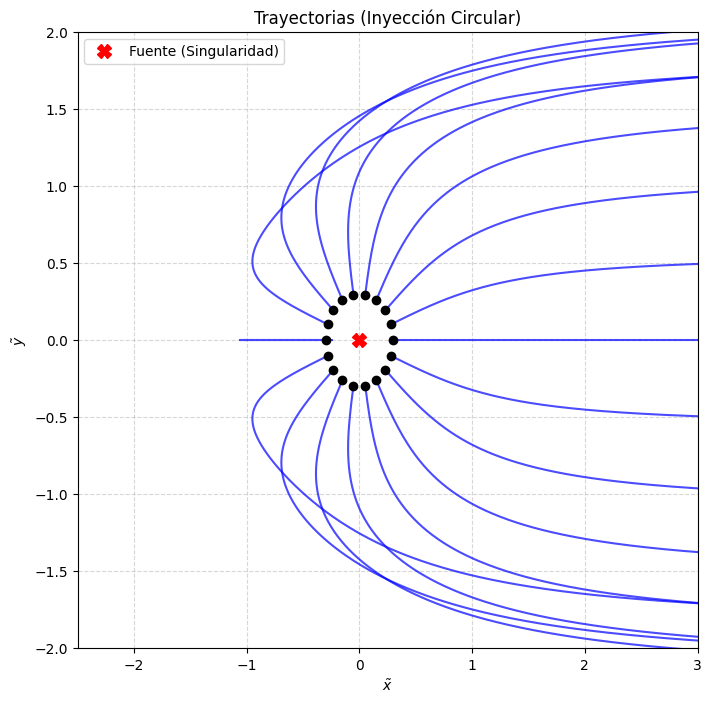

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# --- Motor Numérico Original ---
def esquema(X, u, t, dt):
    return X + u(X, t) * dt

def trayectoria(X0, u, N, dt):
    d = X0.shape[0]
    ts = np.arange(0, N+1)*dt
    Xs = np.zeros((N+1, d))
    Xs[0] = X0
    for j in range(N):
        Xs[j+1] = esquema(Xs[j], u, ts[j], dt)
    return ts, Xs

# --- Campo Físico Estabilizado ---
def campo_adimensional_seguro(X, t):
    x, y = X[0], X[1]
    r2 = x**2 + y**2

    # Parámetro de suavización (Softening) para evitar la explosión de Euler
    epsilon = 0.05
    denom = r2 + epsilon**2

    u_x = (x / denom) + t
    u_y = (y / denom)
    return np.array([u_x, u_y])

# --- Esqueleto Modificado: Inyección Circular ---
N = 400
dt = 1e-2

# Generamos un anillo de 18 partículas alrededor de la fuente
radio_inyeccion = 0.3
thetas = np.linspace(0, 2*np.pi, 18, endpoint=False)
l0s = np.array([[radio_inyeccion * np.cos(th), radio_inyeccion * np.sin(th)] for th in thetas])

plt.figure(figsize=(8, 8))

for i in range(l0s.shape[0]):
    # Llamamos al integrador lagrangiano
    t_arr, Xs = trayectoria(l0s[i], campo_adimensional_seguro, N, dt)

    # Graficamos el punto inicial (el círculo negro) y la trayectoria azul
    plt.plot(Xs[0,0], Xs[0,1], "ko", zorder=3)
    plt.plot(Xs[:,0], Xs[:,1], "b-", alpha=0.7)

# Marcamos el origen (la fuente suavizada)
plt.plot(0, 0, 'rX', markersize=10, zorder=4, label='Fuente (Singularidad)')

# Ajustamos los límites de la ventana de visualización
plt.xlim(-2.5, 3)
plt.ylim(-2, 2)
plt.xlabel(r'$\tilde{x}$')
plt.ylabel(r'$\tilde{y}$')
plt.title('Trayectorias (Inyección Circular)')
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend()
plt.show()

Ahora nos disponemos a hacer trayectoria y lineas de corriente del segundo campo...

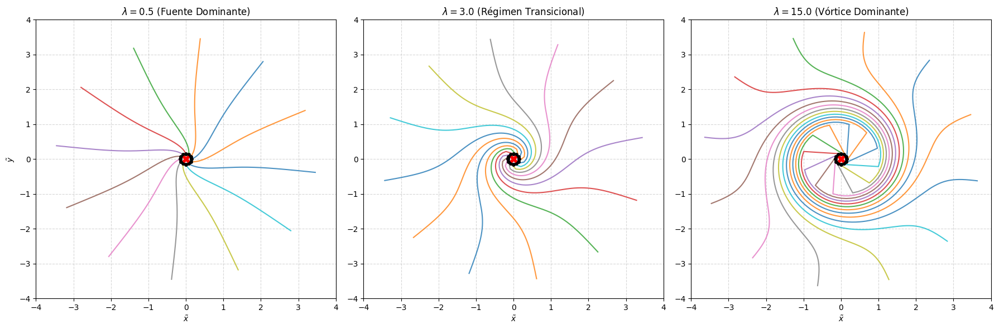

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Motor de Integración ---
def esquema(X, u, t, dt):
    return X + u(X, t) * dt

def trayectoria(X0, u, N, dt):
    d = X0.shape[0]
    ts = np.arange(0, N+1)*dt
    Xs = np.zeros((N+1, d))
    Xs[0] = X0
    for j in range(N):
        Xs[j+1] = esquema(Xs[j], u, ts[j], dt)
    return ts, Xs

# --- 2. Modelo Físico Parametrizado ---
def campo_ii(X, t, lam):
    """
    Campo adimensional: Fuente + Torbellino decadente.
    lam (lambda) es el parámetro libre: (Fuerza del Vórtice / Caudal).
    """
    x, y = X[0], X[1]
    r2 = x**2 + y**2

    # Softening para la singularidad central
    denom = r2 + 1e-4

    # Término de fuente (radial)
    u_r_x = x / denom
    u_r_y = y / denom

    # Término de vórtice (azimutal) con decaimiento temporal
    decaimiento = np.exp(-t)
    u_theta_x = (-y / denom) * decaimiento
    u_theta_y = (x / denom) * decaimiento

    # Superposición
    u_x = u_r_x + lam * u_theta_x
    u_y = u_r_y + lam * u_theta_y

    return np.array([u_x, u_y])

# --- 3. Parámetros de Simulación e Inyección ---
N_pasos = 600
dt = 0.01

# Inyección radial: un pequeño anillo de partículas cerca del origen
radio_inyeccion = 0.15
thetas = np.linspace(0, 2*np.pi, 12, endpoint=False)
l0s = np.array([[radio_inyeccion * np.cos(th), radio_inyeccion * np.sin(th)] for th in thetas])

# Definimos los regímenes que queremos estudiar
lambdas_a_evaluar = [0.5, 3.0, 15.0]
titulos = [
    r'$\lambda = 0.5$ (Fuente Dominante)',
    r'$\lambda = 3.0$ (Régimen Transicional)',
    r'$\lambda = 15.0$ (Vórtice Dominante)'
]

# --- 4. Bucle de Integración y Visualización ---
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for idx, lam in enumerate(lambdas_a_evaluar):
    ax = axes[idx]

    # Envolvemos el campo con una función lambda de Python para fijar el parámetro lam
    # y que la función 'trayectoria' solo vea las variables X y t.
    campo_fijado = lambda X, t: campo_ii(X, t, lam)

    for i in range(l0s.shape[0]):
        ts, Xs = trayectoria(l0s[i], campo_fijado, N_pasos, dt)
        ax.plot(Xs[0,0], Xs[0,1], "ko", markersize=4, zorder=3) # Punto de inicio
        ax.plot(Xs[:,0], Xs[:,1], "-", alpha=0.8)               # Trayectoria

    ax.plot(0, 0, 'rX', markersize=8, zorder=4) # Singularidad

    ax.set_xlim(-4, 4)
    ax.set_ylim(-4, 4)
    ax.set_xlabel(r'$\tilde{x}$')
    if idx == 0: ax.set_ylabel(r'$\tilde{y}$')
    ax.set_title(titulos[idx])
    ax.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# --- 1. Funciones de Integración Numérica ---
def esquema(X, u, t, dt):
    return X + u(X, t) * dt

def linea_de_corriente(l0, u, t, N, ds):
    d = l0.shape[0]
    s = np.arange(0, N+1)*ds
    ls = np.zeros((N+1, d))
    ls[0] = l0
    u_lc = lambda x, _: u(x, t)
    for j in range(N):
        ls[j+1] = esquema(ls[j], u_lc, t, ds)
    return s, ls

# --- 2. Campo Vectorial Adimensionalizado (Ítem ii) ---
def campo_ii(X, t):
    """Fuente + Torbellino decadente (lambda = 5.0)"""
    lam = 5.0
    x, y = X[0], X[1]
    r2 = x**2 + y**2
    denom = r2 + 1e-4  # Softening

    u_r_x = x / denom
    u_r_y = y / denom

    decaimiento = np.exp(-t)
    u_theta_x = (-y / denom) * decaimiento
    u_theta_y = (x / denom) * decaimiento

    u_x = u_r_x + lam * u_theta_x
    u_y = u_r_y + lam * u_theta_y
    return np.array([u_x, u_y])

# --- 3. Tu Esqueleto de Animación (con sintaxis corregida) ---
def evolucionar_lineas(l0s, ts, u, N, ds, ext=None, figsize=None):
    n = l0s.shape[0]   # Cantidad de líneas de corriente
    m = ts.shape[0]    # Cantidad de tiempos (fotogramas)
    ls = np.zeros((m, n, N+1, 2))

    for i in range(m):
        for j in range(n):
            _, ls[i,j] = linea_de_corriente(l0s[j], u, ts[i], N, ds)

    xs = ls[:,:,:,0]
    ys = ls[:,:,:,1]

    if ext is None:
        extent = [np.min(np.array(xs)), np.max(np.array(xs)),
                  np.min(np.array(ys)), np.max(np.array(ys))]
    else:
        extent = ext

    # Guardo el estado de plt
    params_viejos = plt.rcParams.copy() # Corrección para evitar modificar el original
    plt.rc('animation', html='jshtml')

    fig, ax = plt.subplots(1, 1, figsize=figsize, constrained_layout=True)
    plt.close()  # Cerrar la figura, animation va a crear la suya propia

    # Inicializo las curvas
    plots = [ ax.plot([], [], "b-")[0] for i in range(n) ]
    dots  = [ ax.plot([], [], "ko")[0] for i in range(n) ]
    ax.set_title("$t=0$")
    ax.set_xlabel("x")
    ax.set_ylabel("y")

    def init():
        sup = 0
        for i, (x, y) in enumerate(zip(xs[0], ys[0])):
            dots[i].set_xdata([x[0]])
            dots[i].set_ydata([y[0]])
            sup = max(sup, max(np.max(np.abs(x)), np.max(np.abs(y))))

        ax.set_aspect('equal')
        ax.set_xlim(extent[0], extent[1])
        ax.set_ylim(extent[2], extent[3])
        return plots + dots

    def actualizar(t):
        print(f"\rCalculando fotograma {t+1} de {m}", end="")
        for i, (x, y) in enumerate(zip(xs[t], ys[t])):
            plots[i].set_xdata(x)
            plots[i].set_ydata(y)
        ax.set_title(f"Líneas de Corriente a $t={ts[t]:.2f}$")
        return plots + dots

    anim = animation.FuncAnimation(fig, actualizar, init_func=init,
                                   frames=range(0, m), blit=True, repeat=True)

    # Restauro el estado de plt (Corrección de sintaxis)
    plt.rcParams.update(params_viejos)

    return anim

# --- 4. Ejecución del Programa ---
# Inyectamos en un anillo cercano a la singularidad
radios = 0.1
thetas = np.linspace(0, 2*np.pi, 20, endpoint=False)
l0s = np.array([[radios * np.cos(th), radios * np.sin(th)] for th in thetas])

# Tiempos físicos a evaluar (40 fotogramas desde t=0 hasta t=4)
ts = np.linspace(0, 4.0, 40)

# Parámetros espaciales
N = 300
ds = 0.02
limites = [-3.5, 3.5, -3.5, 3.5]

# Generar la animación
animacion = evolucionar_lineas(l0s, ts, campo_ii, N, ds, ext=limites, figsize=(6,6))

# Mostrar en Colab/Jupyter
HTML(animacion.to_jshtml())

Calculando fotograma 40 de 40

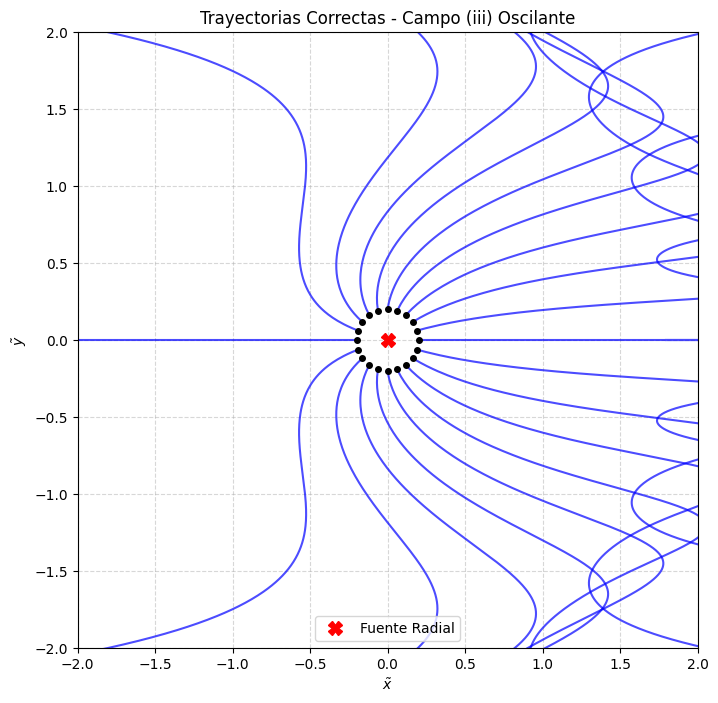

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Motor de Integración (Tu esqueleto exacto) ---
def esquema(X, u, t, dt):
    return X + u(X, t) * dt

def trayectoria(X0, u, N, dt):
    d = X0.shape[0]
    ts = np.arange(0, N+1)*dt
    Xs = np.zeros((N+1, d))
    Xs[0] = X0
    for j in range(N):
        Xs[j+1] = esquema(Xs[j], u, ts[j], dt)
    return ts, Xs

# --- 2. Campo Adimensional ---
def campo_iii(X, t):
    x, y = X[0], X[1]
    r2 = x**2 + y**2

    # Corte de seguridad: si la partícula cae exactamente en el centro geométrico,
    # evitamos que el integrador divida por cero y explote.
    if r2 < 1e-4:
        return np.array([0.0, 0.0])

    u_x = (x / r2) + np.cos(t) # Asumimos S=1 (frecuencia natural)
    u_y = (y / r2)
    return np.array([u_x, u_y])

# --- 3. Puntos Iniciales Apropiados (Anillo central) ---
# Reemplazamos la "L" por un anillo de radio 0.2 alrededor de la fuente
radio = 0.2
thetas = np.linspace(0, 2*np.pi, 20, endpoint=False)
l0s = np.array([[radio * np.cos(th), radio * np.sin(th)] for th in thetas])

# Parámetros de tiempo
N = 600   # Aumentamos N un poco para ver al menos un par de oscilaciones del coseno
dt = 1e-2

# --- 4. Graficación ---
plt.figure(figsize=(8, 8))

for i in range(l0s.shape[0]):
    t_arr, Xs = trayectoria(l0s[i], campo_iii, N, dt)
    plt.plot(Xs[0,0], Xs[0,1], "ko", markersize=4, zorder=3) # Punto inicial
    plt.plot(Xs[:,0], Xs[:,1], "b-", alpha=0.7)              # Trayectoria

plt.plot(0, 0, 'rX', markersize=10, zorder=4, label='Fuente Radial')

# Ampliamos la ventana un poco para ver la trayectoria completa
plt.xlim(-2, 2)
plt.ylim(-2, 2)
plt.xlabel(r'$\tilde{x}$')
plt.ylabel(r'$\tilde{y}$')
plt.title('Trayectorias Correctas - Campo (iii) Oscilante')
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend()
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

def esquema(X, u, t, dt):
    return X + u(X, t) * dt

def linea_de_corriente(l0, u, t, N, ds):
    """Integra la geometría congelando el tiempo t"""
    d = l0.shape[0]
    s = np.arange(0, N+1)*ds
    ls = np.zeros((N+1, d))
    ls[0] = l0
    u_lc = lambda x, _: u(x, t)
    for j in range(N):
        ls[j+1] = esquema(ls[j], u_lc, t, ds)
    return s, ls


def campo_iii_euleriano(X, t):
    """Fuente + Corriente Oscilante en x"""
    S = 1.0 # Parámetro adimensional de frecuencia
    x, y = X[0], X[1]
    r2 = x**2 + y**2


    denom = r2 + 1e-4

    u_x = (x / denom) + np.cos(S * t)
    u_y = (y / denom)
    return np.array([u_x, u_y])


def evolucionar_lineas(l0s, ts, u, N, ds, ext=None, figsize=None):
    n = l0s.shape[0]
    m = ts.shape[0]
    ls = np.zeros((m, n, N+1, 2))

    for i in range(m):
        for j in range(n):
            _, ls[i,j] = linea_de_corriente(l0s[j], u, ts[i], N, ds)

    xs = ls[:,:,:,0]
    ys = ls[:,:,:,1]

    if ext is None:
        extent = [np.min(np.array(xs)), np.max(np.array(xs)),
                  np.min(np.array(ys)), np.max(np.array(ys))]
    else:
        extent = ext

    params_viejos = plt.rcParams.copy()
    plt.rc('animation', html='jshtml')

    fig, ax = plt.subplots(1, 1, figsize=figsize, constrained_layout=True)
    plt.close()

    # disntintos colores para distitnoas trayectorias
    plots = [ ax.plot([], [], "darkcyan", alpha=0.7)[0] for i in range(n) ]
    dots  = [ ax.plot([], [], "ko", markersize=3)[0] for i in range(n) ]

    ax.set_title("$t=0$")
    ax.set_xlabel(r"$\tilde{x}$")
    ax.set_ylabel(r"$\tilde{y}$")

    def init():
        for i, (x, y) in enumerate(zip(xs[0], ys[0])):
            dots[i].set_xdata([x[0]])
            dots[i].set_ydata([y[0]])


        ax.plot(0, 0, 'rX', markersize=8, zorder=5)

        ax.set_aspect('equal')
        ax.set_xlim(extent[0], extent[1])
        ax.set_ylim(extent[2], extent[3])
        return plots + dots

    def actualizar(t):
        print(f"\rCalculando fotograma {t+1} de {m}", end="")
        for i, (x, y) in enumerate(zip(xs[t], ys[t])):
            plots[i].set_xdata(x)
            plots[i].set_ydata(y)
        ax.set_title(f"Líneas de Corriente a $\\tilde{{t}}={ts[t]:.2f}$")
        return plots + dots

    anim = animation.FuncAnimation(fig, actualizar, init_func=init,
                                   frames=range(0, m), blit=True, repeat=True)

    plt.rcParams.update(params_viejos)
    return anim


# pongo el anillo de emision cerca de la fuente
radio_emision = 0.1
thetas = np.linspace(0, 2*np.pi, 24, endpoint=False)
l0s = np.array([[radio_emision * np.cos(th), radio_emision * np.sin(th)] for th in thetas])

# Evaluamos un ciclo completo del coseno: de 0 a 2*pi
ts = np.linspace(0, 2 * np.pi, 40)

N_pasos = 300
ds = 0.025
limites = [-4.0, 4.0, -4.0, 4.0]

# para poner un deslizador o parametrizador
animacion = evolucionar_lineas(l0s, ts, campo_iii_euleriano, N_pasos, ds, ext=limites, figsize=(6,6))
HTML(animacion.to_jshtml())

Calculando fotograma 40 de 40

# **Problema 3: Integración mediante PINNs**

Elija un flujo del Problema 1 o del Problema 2. Compararemos las trayectorias obtenidas (sea analítica o numéricamente) con lo obtenido mediante el uso de Redes Neuronales Informadas por la Física (PINNs, vease apunte).
Limitese a una única trayectoria, dada por un único punto inicial $(x_0, y_0)$ y un dado conjunto de parámetros adimensionales (si elige un flujo del Problema 1, antes adimensionalícelo).
Elija un tiempo de integración $T$ tal que la dinámica es rica (puede ser el mismo que usó para integrar numéricamente).
En la celda a continuación le proporcionamos la estructura general de la PINN.

(i) Provea a la red con $10$ puntos de entrenamiento de datos, $20$ puntos de entrenamiento de física y $\lambda = 10^{-4}$, ambos equiespaciados en $[0, T]$ (asegúrese de incluir tanto $0$ cómo $T$), y entrénela durante $20000$ épocas. Grafique tanto el error de los datos cómo el de la física en función de la época para determinar. Interprete. ¿Cuantas épocas considera suficientes?

(ii) Utilice la red entrenada (con $20000$ épocas) para calcular la trayectoria más allá de $T$ y calcule el error $\epsilon(t) = |\mathbf{X}_\mathrm{PINN}(t) - \mathbf{X}(t)|$. Grafiquelo e interprete. ¿Hasta que valor de $t$ considera adecuada la red? ¿Puede identificar los tiempos donde $\mathbf{X}(t)$ corresponde a un punto de entrenamiento y/o de física? Repita esto para un entrenamiento con puntos de entrenamiento de física uniformemente distribuidos en $[0, 2T]$, **sin cambiar la cantidad**. ¿Mejora la aproximación? Interprete.

(iii) Manteniendo los $20$ puntos de entrenamiento de física, varíe la cantidad de puntos de entrenamiento de datos $N_d$ entre $2$ y $20$ y grafique el error medio $\epsilon_M = \sum_n \epsilon(t_n)$ para cada $N_d$. Interprete la ganancia de precisión teniendo en cuenta el tiempo de entrenamiento necesario. ¿Cambia la cantidad de épocas óptima para cada $N_d$?

(iv) Repita el inciso anterior pero manteniendo $N_d = 10$ puntos de entrenamiento de datos y varíe la cantidad de puntos de entrenamiento de física $N_f$ entre $5$ y $50$.

(v) Fijando $N_d=10$ y $N_f=20$, varie $\lambda$ logarítmicamente entre $10^{-6}$ y $10^{-1}$ y compare ambas funciones de pérdida y $\epsilon_M$ para cada caso.

(vi) (Opcional) Fijando $N_d$, $N_f$ y $\lambda$ a gusto, pruebe distintas arquitecturas para la red y compare sus desempeños. ¿Considera alguna óptima? _Ayuda: Por cuestiones de desempeño, evite redes con más de 3 capas ocultas._

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch.autograd import Variable
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

class MLP(torch.nn.Module):
    """
    Multilayer perceptron (MLP) // Perceptrón Multicapa .

    Esta clase define una red neuronal feedforward con múltiples capas ocultas
    lineales, funciones de activación tangente hiperbólica en  las capas ocultas
    y una salida lineal.

    Args:
        sizes (lista): Lista de enteros que especifica el número de neuronas en
        cada capa. El primer elemento debe coincidir con la dimensión de entrada
        y el último con la dimensión de salida.

    Atributos:
        capas (torch.nn.ModuleList): Lista que contiene las capas lineales del MLP.

    Métodos:
        forward(x): Realiza una pasada hacia adelante a través de la red MLP.

    Ejemplo:
        tamaños = [entrada_dim, oculta1_dim, oculta2_dim, salida_dim]
        mlp = MLP(tamaños)
        tensor_entrada = torch.tensor([...])
        salida = mlp(tensor_entrada)
    """
    def __init__(self,sizes):
        super().__init__()
        self.layers = torch.nn.ModuleList()
        for i in range(len(sizes)-1):
            self.layers.append(torch.nn.Linear(sizes[i],sizes[i+1]))
    def forward(self,x):
        h = x
        for hidden in self.layers[:-1]:
            h = torch.tanh(hidden(h))
        output = self.layers[-1]
        y = output(h)
        return y

pinn = MLP([1, 32, 32, 2])
optimizer = torch.optim.Adam(pinn.parameters(), lr=1e-4)

iterations = 15000
l = 1e-4   # Lambda

################################################################################
############################## SU RESOLUCIÓN AQUÍ ##############################
################################################################################

# **Problema 4: Estimación de parámetros con PINNs**

Un grupo de Laboratorio 5 elige hacer la mejor práctica de la materia: Fluidos.
En esta práctica, se introduce un agitador magnético para generar un vórtice dentro de un recipiente cilíndrico y se usa el método velocimetría de imágenes de partículas (PIV, por sus siglas en inglés).
Esto permite medir el campo de velocidades $\mathbf{u}(\mathbf{x}, t)$ sobre la superficie, habitualmente modelado mediante el vórtice de Burgers
$$ \mathbf{u}_B(\mathbf{x}, t) = -\alpha r \mathbf{\hat{r}} + \frac{\Gamma}{2\pi r}\left[1 - \exp\left(-r^2/r_0^2\right)\right]\boldsymbol{\hat{\theta}} + 2\alpha z\mathbf{\hat{z}} $$
donde $\Gamma$ es la circulación asintótica del vórtice, $\alpha$ un parámetro que controla el flujo radial y $r_0 = \alpha / 2\nu$ un radio característico del vórtice controlado por la velocidad y la viscosidad.
Dado que se mira la superficie, la componente $z$ suele ignorarse por completo.

Sin embargo, las cámaras de alta velocidad necesarias para hacer PIV no funcionan y no pudieron ser reemplazadas por cuestiones presupuestarias. Ante la desesperación, el grupo decide introducir una pequeña bolita de polietileno dentro del flujo y grabarla con un celular.
Luego, el grupo elige algunos de los cuadros del video donde tanto el centro del vórtice cómo la bolita se ven claramente y, muy laboriosamente, determinan la posición relativa de ambos.
Estos datos se encuentran en el archivo `posiciones.txt`, con la posición $\mathbf{X}(t)$ (en cartesianas) de la boltia respecto al vórtice (que se considera en el origen) para los $t$ indicados. Las distancias están medidas en centimetros y el tiempo en segundos.

Entrene una PINN que ajuste la trayectoria mediante el modelo de Burgers $\dot{\mathbf{X}} = \mathbf{u}_B(\mathbf{X}, t)$ y aprenda los parámetros $\alpha$, $\Gamma$ y $r_0$. La predicción de la PINN debe coincidir con los datos provistos en una trayectoria aproximadamente espiralada, cómo mínimo. Puede usar el siguiente esqueleto, que además contiene estimaciones del orden de magnitud de los distintos parámetros hechos por el grupo. Los parámetros propuestos no son necesariamente óptimos, es libre de cambiarlos todos.

**Nota:** Por simplicidad, ignoraremos los errores en la medición de estos datos, pero podrían incluirse cómo un término adicional de la función de pérdida.

In [ ]:
# Cargar datos
!pip install -q gdown
!gdown 1USjbT0fCDREgM0KIFsn_9JCvcA7jBXuD -O posiciones.txt

t_data, x_data, y_data = np.loadtxt("posiciones.txt", unpack=True)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch.autograd import Variable
from tqdm import tqdm
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

class MLP(torch.nn.Module):
    """
    Multilayer perceptron (MLP) // Perceptrón Multicapa .

    Esta clase define una red neuronal feedforward con múltiples capas ocultas
    lineales, funciones de activación tangente hiperbólica en  las capas ocultas
    y una salida lineal. Esta versión tiene como diferencia que existen
    parámetros entrenables que forman parte de la física del problema.

    Args:
        sizes (lista): Lista de enteros que especifica el número de neuronas en
        cada capa. El primer elemento debe coincidir con la dimensión de entrada
        y el último con la dimensión de salida.

    Atributos:
        -capas (torch.nn.ModuleList): Lista que contiene las capas lineales del MLP.
        -w0 (torch.nn.Parameter): Parámetro entrenable que representa la frecuencia natural del oscilador.
        -d (torch.nn.Parameter): Parámetro entrenable que representa el coeficiente de amortiguamiento.

    Métodos:
        forward(x): Realiza una pasada hacia adelante a través de la red MLP.

    Ejemplo:
        tamaños = [entrada_dim, oculta1_dim, oculta2_dim, salida_dim]
        mlp = MLP(tamaños)
        tensor_entrada = torch.tensor([...])
        salida = mlp(tensor_entrada)
    """
    def __init__(self,sizes):
        super().__init__()
        self.layers = torch.nn.ModuleList()
        self.alp = torch.nn.Parameter(data=torch.Tensor([0.1]), requires_grad=True)
        self.Gam = torch.nn.Parameter(data=torch.Tensor([10]), requires_grad=True)
        self.r02 = torch.nn.Parameter(data=torch.Tensor([1]), requires_grad=True)
        for i in range(len(sizes)-1):
            self.layers.append(torch.nn.Linear(sizes[i],sizes[i+1]))
    def forward(self,x):
        h = x
        for hidden in self.layers[:-1]:
            h = torch.tanh(hidden(h))
        output = self.layers[-1]
        y = output(h)
        return y

pinn = MLP([1, 32, 32, 2])
optimizer = torch.optim.Adam(pinn.parameters(), lr=1e-4)

################################################################################
############################## SU RESOLUCIÓN AQUÍ ##############################
################################################################################